## Exercise 2:Analysis of Gasoline Prices

Name:Niharika Kumari

In [2]:
import pandas as pd
import numpy as np

# import bokeh 
from IPython.display import display, Markdown
from bokeh.plotting import figure, show, Figure
from bokeh.models import ColumnDataSource, Label
from bokeh.models import HoverTool
from bokeh.models.glyphs import Text
from bokeh.palettes import Spectral3
from bokeh.layouts import row, column, gridplot
import seaborn as sns
import matplotlib.pylab as plt
from sklearn.model_selection import TimeSeriesSplit
#from bokeh.io import output_file, show
from bokeh.models import GeoJSONDataSource
import bokeh.models as bmo

from bokeh.sampledata.sample_geojson import geojson
import bokeh.palettes as bp
from pandas import DataFrame
# tell bokeh to show the figures in the notebook
from bokeh.io import output_notebook
output_notebook()
#latest
import pandas as pd
import missingno as msno
import warnings
warnings.filterwarnings('ignore')





Loading BokehJS ...

# Preprocessing of Data

We need to clean the station data as there are data missing

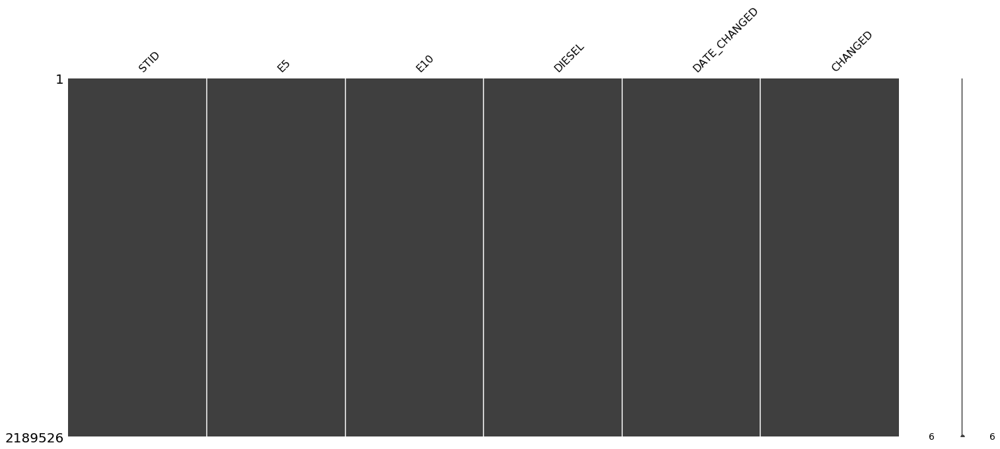

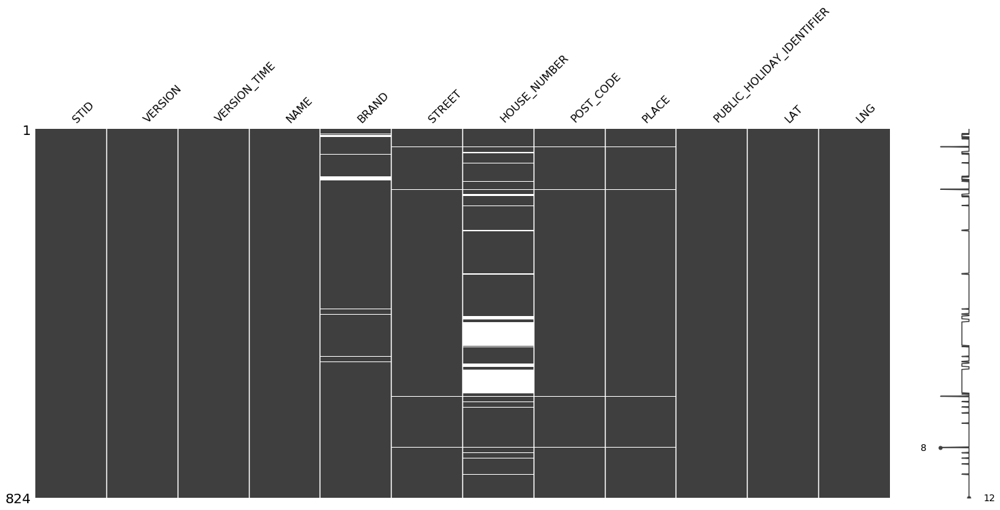

In [3]:
prices = pd.read_csv('example_sprit_cut_prices.csv', sep=';')
msno.matrix(prices)
#print(prices.head())

station = pd.read_csv('example_sprit_cut_station.csv', sep=';')
station.rename(columns={'ID':'STID'}, inplace=True)
msno.matrix(station)
#print(station.head())
#station.info()

# Data Cleaning:

In [4]:
import numpy as np
#remove all unimportant columns from station dataframe  
to_drop = ['HOUSE_NUMBER','PUBLIC_HOLIDAY_IDENTIFIER']
station.drop(to_drop, inplace=True, axis=1)
station.drop_duplicates(keep=False)
station.fillna(0, inplace=True)

    
#ms.matrix(station)
#station = station.replace('', np.nan, inplace=True)
station.fillna(value='UNKNOWN')

#removing non active brands
station = station[station['POST_CODE'] != 'nicht']
#station.loc[station['POST_CODE'] == 'nicht']
station.replace('\\N', 'UNKNOWN', inplace=True)
#station.replace(0, 'UNKNOWN', inplace=True)

station.loc[station['BRAND'] == 'UNKNOWN']
station['POST_CODE'] = station['POST_CODE'].replace('UNKNOWN', '0')
#print(station['POST_CODE'].unique())
station['VERSION_TIME']= pd.to_datetime(station['VERSION_TIME']) 
prices['DATE_CHANGED']= pd.to_datetime(prices['DATE_CHANGED']) 
station['LAT'] = station['LAT'].astype(float)
station['LNG'] = station['LNG'].astype(float)
station = station[station.BRAND != 0]
station = station[station.BRAND != 'UNKNOWN']
station.replace({'BRAND' : { '^Auto Zotz.*' : 'Auto Zotz', 
                                           '^Frei.*' : 'Freie Tankstelle',
                                           '^Raiffeisen.*' : 'Raiffeisen Tankstelle',
                                           '^Sb.*' : 'Sb Markt Tankstelle',
                                           '^Supermarkt.*' : 'Supermarkt Tankstelle'
                                            }},regex=True,inplace=True)

station.replace({'BRAND' : { '^Autohaus Holz.*' : 'Autohaus Holz', 
                                           '^Eberhardt.*' : 'Eberhardt',
                                           '^Globus Handelshof .*' : 'Globus Handelshof Gmbh & Co. Kg',
                                           '^Sbk .*' : 'Sbk - Tankstelle',
                                            }},regex=True,inplace=True)

station['BRAND'].str.upper()

station['BRAND'].unique()

array(['ARAL', 'JET', 'Supermarkt Tankstelle', 'Tankhof Iffezheim',
       'Schiffer & Nicklaus GmbH', 'Sefrin Heizöl & Kraftstoffe', 'bft',
       'Markant', 'AVIA', 'Bft', 'Freie Tankstelle',
       'AUTO ZOTZ Landau in der Pfalz   Tanken und waschen', 'HEM',
       'Fritz Walter GmbH', 'TAMOIL', 'rnt', 'Schuster & Sohn KG',
       'Raiffeisen Tankstelle', 'E Center', 'Eberhardt', 'BFT', 'Agip',
       'Winkler', 'Mr. Wash Autoservice AG', 'ESSO',
       'ZG Raiffeisen Energie', 'freie Tankstelle', 'CLASSIC', 'Shell',
       'Preis', 'mtb', 'Tankcenter', 'TS ARNT', 'frei', 'OMV',
       'Frühmesser GmbH', 'OIL!', 'SB Markt', 'SB', 'TOTAL', 'ED',
       'SB-Markttankstelle',
       'AUTO ZOTZ Herxheim b.LD.       Tanken an L.493', 'Total',
       'Markenfreie TS', 'TOP', 'T', 'ELAN', 'Tankstelle Heinz'],
      dtype=object)

In [5]:
def remove_invalid_prices(fuel_name):
    fuel_invalid=prices[prices[fuel_name]<=0]
    prices.drop(fuel_invalid.index,axis=0,inplace=True)

remove_invalid_prices('E5')
remove_invalid_prices('E10')
remove_invalid_prices('DIESEL')

In [6]:
def normalise_data(fuel_name):
    data_mean, data_std = prices[fuel_name].mean(), prices[fuel_name].std()
    # identify outliers upto 3 standard deviations
    cut_off = data_std * 3
    lower, upper = data_mean - cut_off, data_mean + cut_off

    prices[fuel_name]=np.where(np.logical_or(prices[fuel_name] <
                                                lower,prices[fuel_name] > upper), 
                                  prices[fuel_name].median(), 
                                  prices[fuel_name])


normalise_data('E5')
normalise_data('E10')
normalise_data('DIESEL')


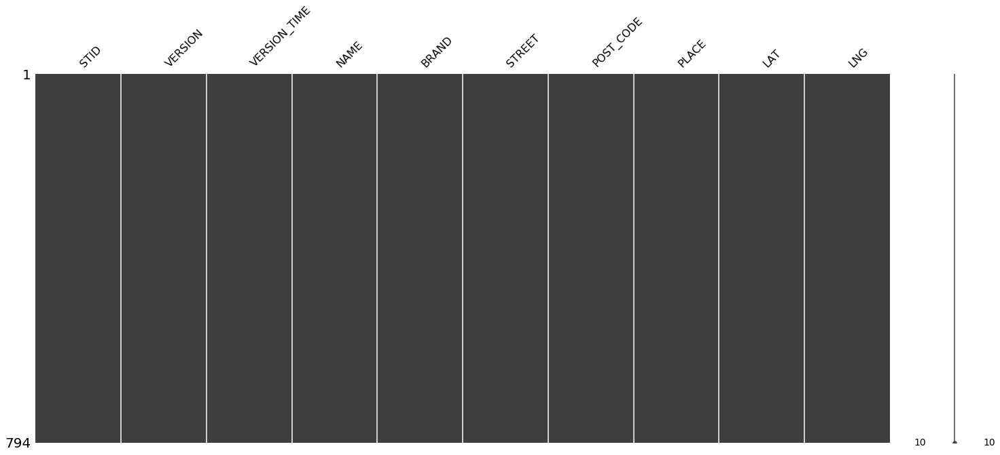

In [7]:
msno.matrix(station)

data is clean.

In [8]:
#visualisation
import datetime


prices['DATE_CHANGED'] = pd.to_datetime(prices['DATE_CHANGED'])

#station[['LAT', 'LNG','BRAND','NAME','VERSION_TIME']]
#station['DAYS'] = currentDT -station['VERSION_TIME']
#station[['LAT', 'LNG','BRAND','NAME','VERSION_TIME','DAYS']]

In [9]:

merged_df= pd.merge(station,prices, on='STID')
#print(merged_df.head())
no_of_stations = merged_df.STID.nunique()
no_of_brands = merged_df.BRAND.nunique()
print('No of unique stations are%d'%no_of_stations)
print('No of unique brands are%d'%no_of_brands)

# brand_existence = merged_df.groupby('BRAND')['DATE_CHANGED']
# brand_start=brand_existence.min().reset_index()
# brand_end=brand_existence.max().reset_index()
# # get brand history in days and 
# brand_history = (pd.to_datetime(brand_end['DATE_CHANGED'])-pd.to_datetime(brand_start['DATE_CHANGED'])).dt.days
# brand_end['No of Days'] = brand_history
history = merged_df.groupby(['STID']).DATE_CHANGED.agg([min,max]).reset_index()
history['history_days'] = history['max']-history['min']
history['history_days'] =history['history_days'] / np.timedelta64(1, 'D')
history = history.reset_index().sort_values('history_days', ascending=False)
top_100 = history['STID'][:3]
#top_3 = history['STID'][:3]
history.head(5)
#print(top_100)

No of unique stations are387
No of unique brands are49


,index,STID,min,max,history_days
7,7,033bce61-7584-45e7-94dd-952fd0b4899c,2014-06-08 09:50:01,2015-09-29 23:34:01,478.572222
88,88,446bb537-46ac-47b2-86e9-d8b8193f1285,2014-06-08 09:50:01,2015-09-29 23:34:01,478.572222
229,229,94179bf8-764e-4721-b261-62c7bd510995,2014-06-08 09:50:01,2015-09-29 23:34:01,478.572222
34,34,197a2371-2190-40c8-b899-67136a2cd51b,2014-06-08 09:50:01,2015-09-29 23:30:01,478.569444
85,85,41a91145-91f7-441b-8ff4-a46f5aff37cc,2014-06-08 09:50:01,2015-09-29 23:30:01,478.569444


In [10]:
def bar_chart(x,y,x_label,y_label):
    

    p = figure(x_range=x, plot_height=350,plot_width=800, 
           toolbar_location=None, tools="")

    p.vbar(x=x, top=y, width=0.3)
    p.xgrid.grid_line_color = None
    p.xaxis.axis_label = x_label
    p.yaxis.axis_label = y_label
    p.xaxis.major_label_orientation = 0.5
    p.y_range.start = 0

    show(p)

In [11]:
#history = history.drop(history.index[0])
#print(list(history['BRAND']))
#bar_chart(list(history['STID']),history['history_days'],'STID','days')

# Extract the top 100 gas stations with longest history

In [12]:
#extract the prices of only the top 100 stids
top100_prices = prices[prices['STID'].isin(top_100)]

top100_prices['HR'] = top100_prices['DATE_CHANGED'].map(
    lambda x: x.hour
)
top100_prices['date'] = top100_prices['DATE_CHANGED'].map(
    lambda x: x.date()
)
top100_prices.head()
top100_prices = top100_prices[top100_prices['HR'].isin([7,8,9,10,11,12,13,14,15,16,17,18,19,20])]

top100_prices.head(5)
#top100_prices.describe()


,STID,E5,E10,DIESEL,DATE_CHANGED,CHANGED,HR,date
153382,94179bf8-764e-4721-b261-62c7bd510995,1299.0,1259.0,1179.0,2014-12-16 16:46:01,21,16,2014-12-16
153383,94179bf8-764e-4721-b261-62c7bd510995,1289.0,1249.0,1139.0,2014-12-17 15:22:01,20,15,2014-12-17
153389,94179bf8-764e-4721-b261-62c7bd510995,1459.0,1419.0,1319.0,2014-11-06 09:13:00,20,9,2014-11-06
153390,94179bf8-764e-4721-b261-62c7bd510995,1489.0,1449.0,1299.0,2014-11-06 09:49:00,21,9,2014-11-06
153391,94179bf8-764e-4721-b261-62c7bd510995,1489.0,1449.0,1309.0,2014-11-07 09:41:00,21,9,2014-11-07


In [13]:
e5_data = top100_prices.copy()
e5_data = e5_data.drop(labels = ["E10",'DIESEL'],axis = 1) 

e10_data = top100_prices.copy()
e10_data = e10_data.drop(labels = ["E5",'DIESEL'],axis = 1) 

diesel_data = top100_prices.copy()
diesel_data = diesel_data.drop(labels = ["E5",'E10'],axis = 1) 

diesel = diesel_data.groupby(['STID','date']).DIESEL.agg(['mean']).reset_index()
e5 = e5_data.groupby(['STID','date']).E5.agg(['mean']).reset_index()
e10 = e10_data.groupby(['STID','date']).E10.agg(['mean']).reset_index()

e5.insert(0, 'index', range(0, 0 + len(e5)))
e10.insert(0, 'index', range(0, 0 + len(e10)))
diesel.insert(0, 'index', range(0, 0 + len(diesel)))
#print(diesel.head())

In [13]:
def line(x,y,x_label,y_label):
    
    p = figure(plot_width=600, plot_height=400)

    
    # add a line renderer
    p.xaxis.axis_label = x_label
    p.yaxis.axis_label = y_label
    p.line(x, y, line_width=2)

    show(p)

In [14]:
def rolling_average(train,test):
    train = np.array(train)
    if test.empty == False:
        test = test.values
    mean  = train.mean()
    loss = abs(mean - test)
    return loss,mean

In [15]:
from statistics import mean 

In [16]:
def get_minloss_window(dic):
    min_window=min(dic.items(), key=lambda x: x[1]) 
    return min_window[0]
    

In [17]:
def train(e5_train):
    n = len(e5_train['date'])

    X = e5_train['date']
    Y = e5_train['mean']

    tscv = TimeSeriesSplit(max_train_size=None, n_splits=n-1)
    count = 0
    window_dict = {} 
    for train_index, test_index in tscv.split(e5_train):

        train = e5_train.iloc[train_index]
        test = e5_train.iloc[test_index]

        #print(train_index, test_index)
        train_start, train_end = train.iloc[0,0], train.iloc[-1,0]
        test_start, test_end = test.iloc[0,0], test.iloc[-1,0] 
        
     
        y_train, y_test = Y[train_start:train_end+1], Y[test_start:test_end+1]
        
        iloss,mean = rolling_average(y_train,y_test)
     

        window_dict[len(train_index)]  =  iloss
        
    return window_dict,get_minloss_window(window_dict)  


In [18]:
#Take window size of 3 and do prediction on test set
def predict(dataset,opt_win,n):
    
    #print(n)
    X = dataset['date']
    #print(X)
    Y = dataset['mean']

    #print(Y.iloc[0])
    #Y=Y.drop(labels=['index'])
    #Y = Y.reset_index()
    train_index = [i for i in range(opt_win)]

    train = dataset.iloc[train_index]


    #print(train_index, test_index)
    train_start, train_end = int(train.iloc[0,0]), int(train.iloc[-1,0])

    #print(train_start,train_end)
    prediction = []
    count = 1
    last_date = X.iloc[train_end]
    #print(last_date)
    while (count<n or count== n ):

        #X_train = X[train_start:train_end+1]
        y_train = Y[train_start:train_end+1]
        #print(train_start,train_end)
        #print(y_train)
        equation = pd.Series([])
        iloss,mean = rolling_average(y_train,equation)
        #print('mean was---------------------',mean)

        #print(last_date)

        next_date = last_date + datetime.timedelta(days=1)

        prediction.append([next_date,mean])

        #X.append(pd.Series([next_date]))
        Y = Y.append(pd.Series([mean]),ignore_index = True)
        #print(Y.iloc[-1])

        train_start = train_start+1
        train_end  =   train_end+1
        last_date = next_date


        count = count+1
    return prediction

# Creating Model for prediction and training

Find the optimal window size

probability distribution curve for loss 

# plot line chart to show the variation between predicted and actual mean

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
 
def multiline(merged_data):
    plt.plot( 'date', 'mean', data=merged_data, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
    plt.plot( 'date', 'predict_mean', data=merged_data, marker='', color='olive', linewidth=2)
    #plt.plot( 'x', 'y3', data=df, marker='', color='olive', linewidth=2, linestyle='dashed', label="toto")
    plt.legend()


In [20]:
def main(data):
    e5_train, e5_test = np.split(data, [int(.75*len(e5))])
    

    #use timeseries split to spit data
#     n = len(e5_train['date'])

#     X = e5_train['date']
#     Y = e5_train['mean']

#     tscv = TimeSeriesSplit(max_train_size=None, n_splits=n-1)
    #window_dict,opt_win = train(X,Y)
    window_dict,opt_win = train(e5_train)

    x = list(window_dict.keys())
    y = list(window_dict.values())
    line([*window_dict],y,'window_size','loss')
    print('We found optimal size of window to be',opt_win) 
    
    dataset = e5_train[-opt_win:]
    
    dataset = dataset.drop(['STID','index'],axis = 1)
    #dataset['index'] = range(0, len(dataset))
    dataset.insert(loc=0, column='index', value=range(0, len(dataset)))
    #dataset.head()
    # e5_test.index = np.arange(0, len(e5_test))
    # e5_test['index'] = np.arange(0, len(e5_test))
    #print(e5_test.head())
    #loss,predicted_mean = predict(optwin,e5_test)
    n = len(e5_test)
    prediction  = predict(dataset,opt_win,n)
    
    p = DataFrame.from_records(prediction,columns = ['date','predict_mean'])
    #p=p.rename(index={0:'date',1:'mean'}, inplace=True)
    #print(p.head())
    #print(e5_test.head())
    #x = p.merge(e5_test,on ='date')
    merged_data = pd.merge(p, e5_test, on='date')
    merged_data =merged_data.drop(['STID'],axis=1)
    print(merged_data.head())
    
    multiline(merged_data)


We found optimal size of window to be 111669
         date  predict_mean   index         mean
0  2014-10-19   1446.467219  131160  1462.333333
1  2014-10-19   1446.467219  131639  1519.000000
2  2014-10-19   1446.467219  132116  1475.666667
3  2014-10-19   1446.467219  132589  1559.000000
4  2014-10-19   1446.467219  133107  1444.000000


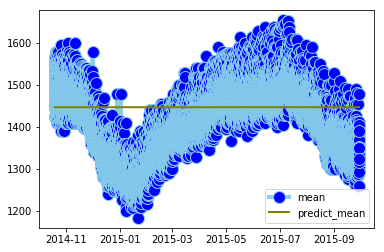

In [21]:
main(e5)

We found optimal size of window to be 96681
         date  predict_mean   index         mean
0  2014-10-19   1238.020726  131160  1282.333333
1  2014-10-19   1238.020726  131639  1369.000000
2  2014-10-19   1238.020726  132116  1282.333333
3  2014-10-19   1238.020726  132589  1374.000000
4  2014-10-19   1238.020726  133107  1249.000000


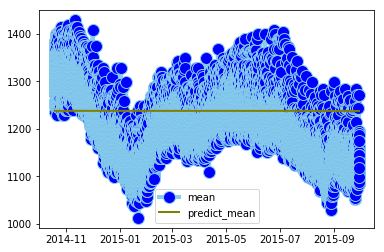

In [22]:
main(diesel)

We found optimal size of window to be 422
         date  predict_mean  index         mean
0  2014-10-06   1410.397032   1075  1527.000000
1  2014-10-07   1410.479332   1076  1517.000000
2  2014-10-08   1410.613169   1077  1519.000000
3  2014-10-09   1410.771020   1078  1519.000000
4  2014-10-10   1410.952942   1079  1490.111111


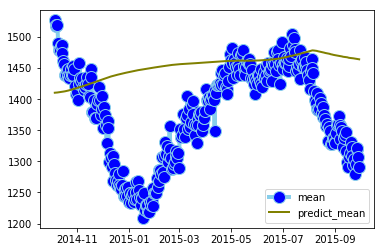

In [26]:
main(e10)

# Prophet Model

In [15]:
import pandas as pd
from fbprophet import Prophet


ERROR:fbprophet:Importing plotly failed. Interactive plots will not work.


In [19]:
def predict_prophet(data):
    e5_data = data[['date', 'mean']].copy()
    e5_data.head()
    e5_data.columns = ['ds', 'y']
    m = Prophet()
    m.fit(e5_data)
    future = m.make_future_dataframe(periods=365)
    future.tail()
    forecast = m.predict(future)
    forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
    fig1 = m.plot(forecast)
    
    

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


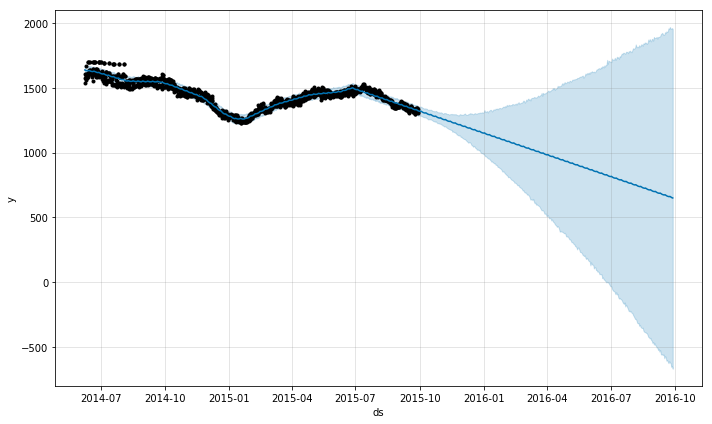

In [20]:
predict_prophet(e5)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


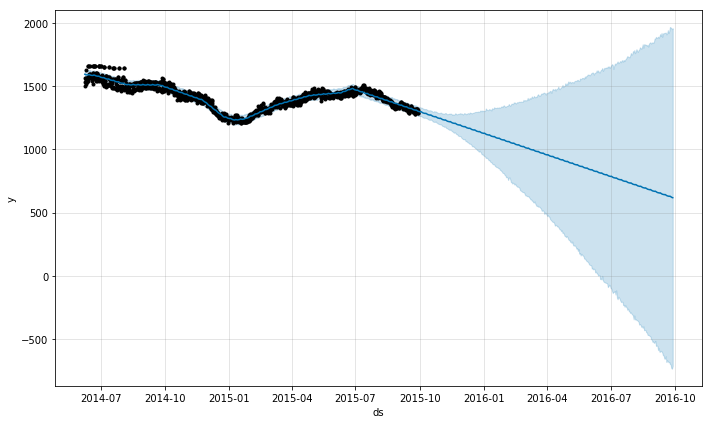

In [21]:
predict_prophet(e10)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


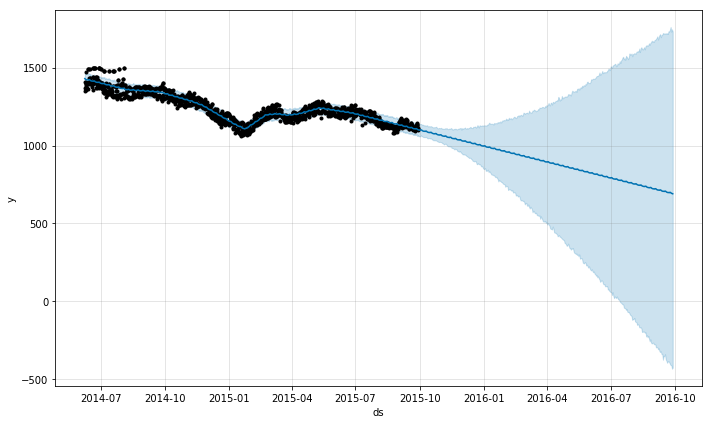

In [22]:
predict_prophet(diesel)

In [23]:
import unittest
import pandas as pd

def get_min(df):
    return df.min()

def get_max(df):
    return df.max()

class MyTest(unittest.TestCase):
    def test_get_min(self):
        d = {'col1': [1, 0, 2, 9, 8, 5], 'col2': [10, 0, -1, 1, -4, 6]}
        df = pd.DataFrame(data=d)
        self.assertEqual(get_min(df["col1"]), 0)
        self.assertEqual(get_min(df["col2"]), -4)
        
    # Returns True if the string is in upper case. 
    def test_upper(self):         
        self.assertEqual('foo'.upper(), 'FOO')
        
    def test_get_max(self):
        d = {'col1': [1, 0, 2, 9, 8, 5], 'col2': [10, 0, -1, 1, -4, 6]}
        df = pd.DataFrame(data=d)
        self.assertEqual(get_max(df["col1"]), 9)
        self.assertEqual(get_max(df["col2"]), 10)
    
        
        

if __name__ == '__main__':
    unittest.main(argv=['first-arg-is-ignored'], exit=False)

...
----------------------------------------------------------------------
Ran 3 tests in 0.004s

OK
